In [ ]:
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings(action='ignore')
import seaborn as sns
import matplotlib.pyplot as plt
import re
import nltk
from wordcloud import WordCloud
from matplotlib import rcParams
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [ ]:
true_df = pd.read_csv("data/True.csv")
fake_df = pd.read_csv("data/Fake.csv")

# Data cleaning

In [ ]:
true_df.tail(10)

,title,text,subject,date
21407,"Mata Pires, owner of embattled Brazil builder ...","SAO PAULO (Reuters) - Cesar Mata Pires, the ow...",worldnews,"August 22, 2017"
21408,"U.S., North Korea clash at U.N. forum over nuc...",GENEVA (Reuters) - North Korea and the United ...,worldnews,"August 22, 2017"
21409,"U.S., North Korea clash at U.N. arms forum on ...",GENEVA (Reuters) - North Korea and the United ...,worldnews,"August 22, 2017"
21410,Headless torso could belong to submarine journ...,COPENHAGEN (Reuters) - Danish police said on T...,worldnews,"August 22, 2017"
21411,North Korea shipments to Syria chemical arms a...,UNITED NATIONS (Reuters) - Two North Korean sh...,worldnews,"August 21, 2017"
21412,'Fully committed' NATO backs new U.S. approach...,BRUSSELS (Reuters) - NATO allies on Tuesday we...,worldnews,"August 22, 2017"
21413,LexisNexis withdrew two products from Chinese ...,"LONDON (Reuters) - LexisNexis, a provider of l...",worldnews,"August 22, 2017"
21414,Minsk cultural hub becomes haven from authorities,MINSK (Reuters) - In the shadow of disused Sov...,worldnews,"August 22, 2017"
21415,Vatican upbeat on possibility of Pope Francis ...,MOSCOW (Reuters) - Vatican Secretary of State ...,worldnews,"August 22, 2017"
21416,Indonesia to buy $1.14 billion worth of Russia...,JAKARTA (Reuters) - Indonesia will buy 11 Sukh...,worldnews,"August 22, 2017"


In [ ]:
true_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21417 entries, 0 to 21416
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   title    21417 non-null  object
 1   text     21417 non-null  object
 2   subject  21417 non-null  object
 3   date     21417 non-null  object
dtypes: object(4)
memory usage: 669.4+ KB


In [ ]:
fake_df.head()

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


In [ ]:
def empty_rows(df):
    empty_index = [index for index,text in enumerate(df.text.values) if str(text).strip() == '']
    print(f"Number of empty text rows: {len(empty_index)}")
    print("Subjects of empty rows: ", df.iloc[empty_index].subject.unique())
    return df.iloc[empty_index].tail()

In [ ]:
empty_rows(fake_df)

Number of empty text rows: 630
Subjects of empty rows:  ['politics' 'Government News' 'left-news']


,title,text,subject,date
21816,BALTIMORE BURNS: MARYLAND GOVERNOR BRINGS IN N...,,left-news,"Apr 27, 2015"
21826,FULL VIDEO: THE BLOCKBUSTER INVESTIGATION INTO...,,left-news,"Apr 25, 2015"
21827,(VIDEO) HILLARY CLINTON: RELIGIOUS BELIEFS MUS...,,left-news,"Apr 25, 2015"
21857,(VIDEO)ICE PROTECTING OBAMA: WON’T RELEASE NAM...,,left-news,"Apr 14, 2015"
21873,(VIDEO) HYSTERICAL SNL TAKE ON HILLARY’S ANNOU...,,left-news,"Apr 12, 2015"


In [ ]:
empty_rows(true_df)

Number of empty text rows: 1
Subjects of empty rows:  ['politicsNews']


,title,text,subject,date
8970,Graphic: Supreme Court roundup,,politicsNews,"June 16, 2016"


In [ ]:
# drop the empty row in true df
true_df = true_df.drop(8970, axis=0)

# Data insights and visualization

In [ ]:
def show_histogram(df, ax, plt, title):
    sns.countplot(df, palette = plt, alpha = 0.5, ax = ax)
    ax.tick_params(axis = 'x', rotation = 90)
    ax.set_title(title)

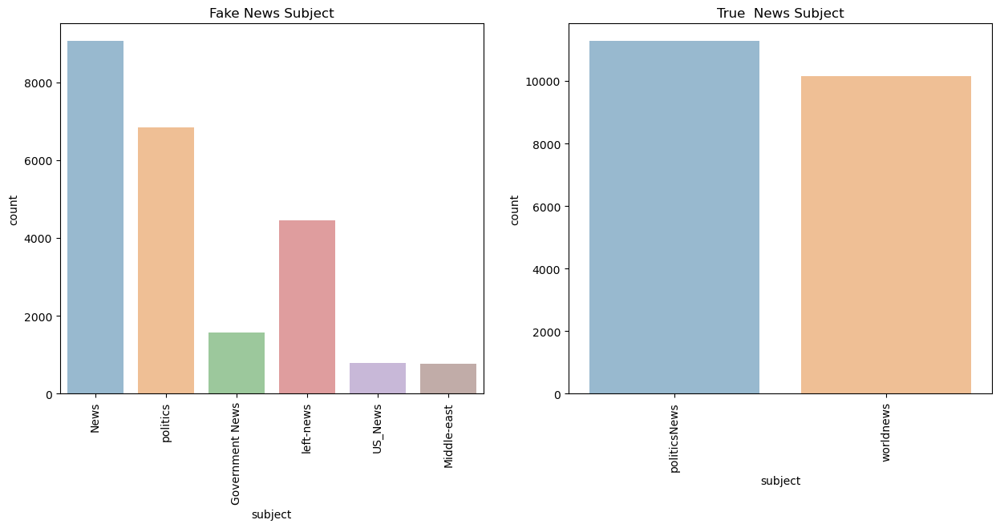

In [ ]:
fig, axes = plt.subplots(1,2, figsize = (15,6))
#Adding the histogram1 - Fake News
show_histogram(fake_df.subject, axes[0], "tab10", 'Fake News Subject')

#Adding the histogram2 - True News
show_histogram(true_df.subject, axes[1], "tab10", "True  News Subject")

In [ ]:
def subject_counts(subject):
    #Counting by Subjects
    for key,count in subject.value_counts().iteritems():
        print(f"{key}:\t{count}")

    #Getting Total Rows
    print(f"Total Records:\t{subject.shape[0]}")

In [ ]:
print("Fake News Subject :")
subject_counts(fake_df.subject)

Fake News Subject :
News:	9050
politics:	6841
left-news:	4459
Government News:	1570
US_News:	783
Middle-east:	778
Total Records:	23481


In [ ]:
print("True News Subject :")
subject_counts(true_df.subject)

True News Subject :
politicsNews:	11272
worldnews:	10145
Total Records:	21417


In [ ]:
from wordcloud import WordCloud

In [ ]:
#Word Cloud
def word_cloud_imshow(df):
    text = ''
    for news in df.text.values:
        text += f" {news}"
    wordcloud = WordCloud(
        width = 3000,
        height = 2000,
        background_color = 'black',
        stopwords = set(nltk.corpus.stopwords.words("english"))).generate(text)
    fig = plt.figure(
        figsize = (40, 30),
        facecolor = 'k',
        edgecolor = 'k')
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()
    del text

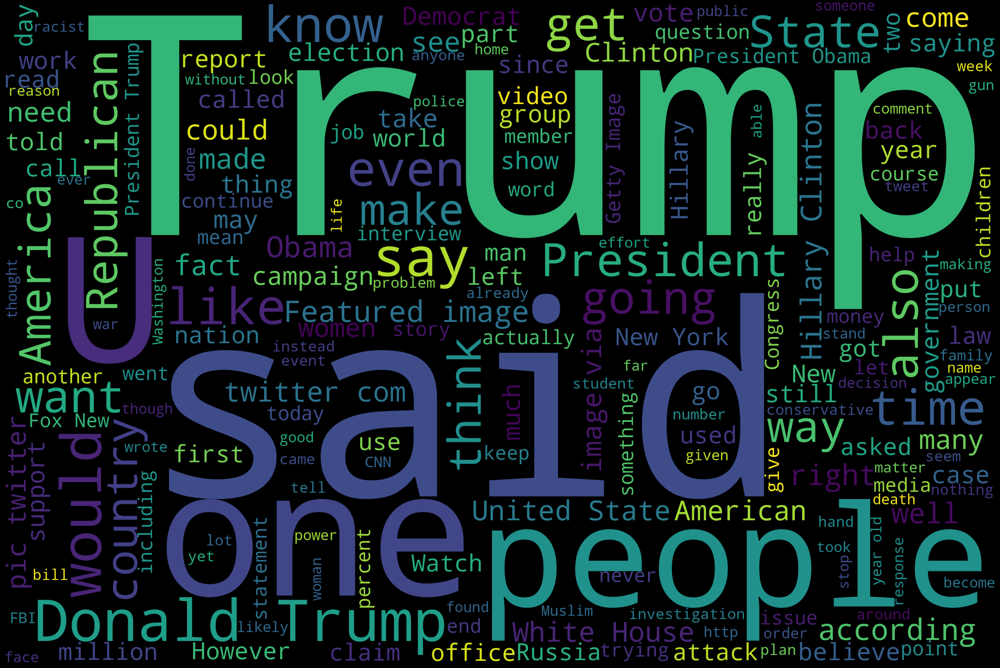

In [ ]:
word_cloud_imshow(fake_df)

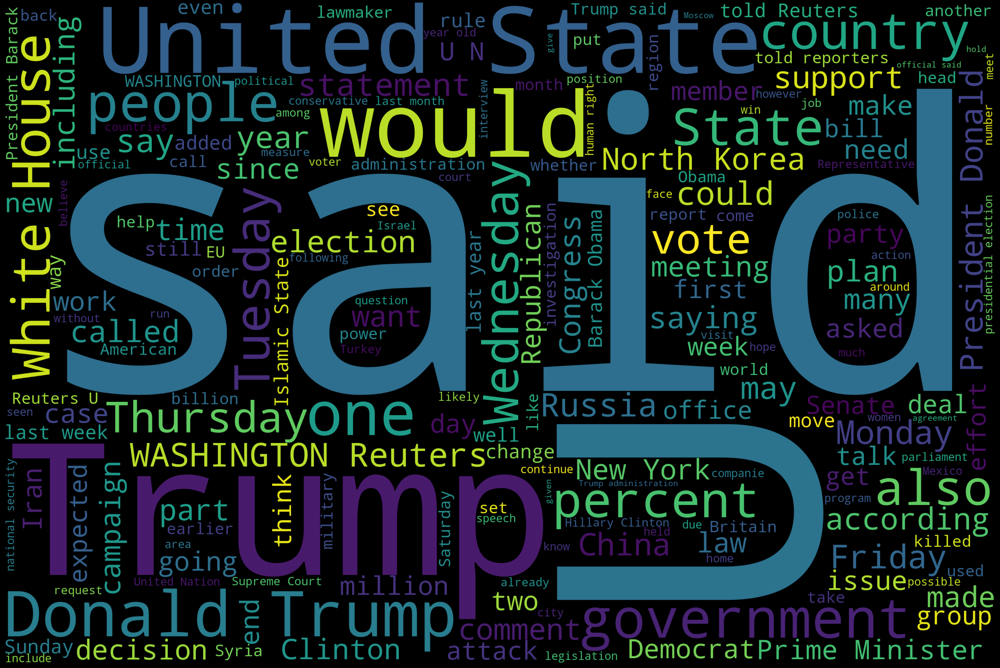

In [ ]:
word_cloud_imshow(true_df)

### Merging the Fake and True news

In [ ]:
true_df['class'] = 1
fake_df['class'] = 0

In [ ]:
df = pd.concat([true_df,fake_df]).sample(frac=1).reset_index(drop=True)

In [ ]:
df.head()

,title,text,subject,date,class
0,HOLY MOLY! Rebel Media Uncovers ILLEGAL USA-Ca...,You ll never guess which mainstream TV network...,politics,"Apr 14, 2017",0
1,U.N. ends month-long Libya talks in Tunisia wi...,TUNIS (Reuters) - Month-long U.N.-backed talks...,worldnews,"October 21, 2017",1
2,‘Tehran’ Tom Cotton Throws Tantrum After Whit...,The Republican senator who gained infamy last ...,News,"April 27, 2016",0
3,WATCH: The Damning Video That Will Utterly De...,"For months now, Donald Trump has been leading ...",News,"January 16, 2016",0
4,RINO SENATOR From “Red State” Tells Illegal Al...,Here are a few facts explaining who the DACA r...,left-news,"Sep 6, 2017",0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44897 entries, 0 to 44896
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   title    44897 non-null  object
 1   text     44897 non-null  object
 2   subject  44897 non-null  object
 3   date     44897 non-null  object
 4   class    44897 non-null  int64 
dtypes: int64(1), object(4)
memory usage: 1.7+ MB


Fake: 0, True: 1


0    23481
1    21416
Name: class, dtype: int64

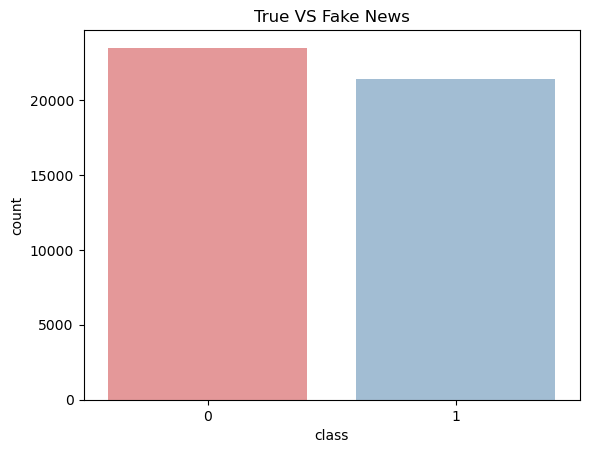

In [ ]:
# show if the data is balanced or not
sns.countplot(df["class"], palette = 'Set1', alpha = 0.5)
plt.title('True VS Fake News')
print("Fake: 0, True: 1")
df["class"].value_counts()

In [ ]:
colors = ['mediumturquoise', 'Red']
labels = ['True','FAKE']
values = df['class'].value_counts()/df['class'].shape[0]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.3)])
fig.update_traces(hoverinfo='label+percent', textinfo='percent', textfont_size=20,
                  marker=dict(colors=colors, line=dict(color='#000000', width=2)))
fig.update_layout(
    title_text="Fake VS True News",
    title_font_color="white",
    legend_title_font_color="yellow",
    paper_bgcolor="black",
    plot_bgcolor='black',
    font_color="white",
)
fig.show()

# preprocessing

In [ ]:
# combine the title and text column
df["text"] = df["title"]+ " " + df["text"]

In [ ]:
df.text[0]

'HOLY MOLY! Rebel Media Uncovers ILLEGAL USA-Canada “Fake Refugee” Trafficking Ring…Wait Until You See Who’s Vetting Them! [VIDEO] You ll never guess which mainstream TV network is right around the corner from this operation! Illegal  refugees  are flooding the 49th parallel from all over America to ILLEGALLY cross into Canada. According to Rebel Media s report, this is a well-organized effort with an American cab company and Greyhound as well as US and Canadian border agents working together to help loosely vetted illegal  fake refugees  cross the border from the US into Canada.Here s how it works: A Greyhound bus or  runners  help to deliver (or TRAFFIC)  fake refugees  from all over the United States to an agreed upon location, where the Town Taxi cab company picks them up and for a fee. Next, the illegal refugees are taken to the Town Taxi cab company headquarters where one man, who says his name is  Victor,  does all of the  vetting  of these  refugees  by himself. Victor was surp

In [ ]:
df.head()

,title,text,subject,date,class
0,HOLY MOLY! Rebel Media Uncovers ILLEGAL USA-Ca...,HOLY MOLY! Rebel Media Uncovers ILLEGAL USA-Ca...,politics,"Apr 14, 2017",0
1,U.N. ends month-long Libya talks in Tunisia wi...,U.N. ends month-long Libya talks in Tunisia wi...,worldnews,"October 21, 2017",1
2,‘Tehran’ Tom Cotton Throws Tantrum After Whit...,‘Tehran’ Tom Cotton Throws Tantrum After Whit...,News,"April 27, 2016",0
3,WATCH: The Damning Video That Will Utterly De...,WATCH: The Damning Video That Will Utterly De...,News,"January 16, 2016",0
4,RINO SENATOR From “Red State” Tells Illegal Al...,RINO SENATOR From “Red State” Tells Illegal Al...,left-news,"Sep 6, 2017",0


In [ ]:
df = df.drop(["title", "subject", "date"], axis=1)

In [ ]:
df.head()

,text,class
0,HOLY MOLY! Rebel Media Uncovers ILLEGAL USA-Ca...,0
1,U.N. ends month-long Libya talks in Tunisia wi...,1
2,‘Tehran’ Tom Cotton Throws Tantrum After Whit...,0
3,WATCH: The Damning Video That Will Utterly De...,0
4,RINO SENATOR From “Red State” Tells Illegal Al...,0


In [ ]:
df.duplicated().sum()

5793

In [ ]:
import re
import string
from nltk.stem import PorterStemmer
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

In [ ]:
def wordProcessing(text: str):
    '''
    Make text lowercase, remove text in square brackets,remove links,remove special characters
    and remove words containing numbers.
    '''
    text = text.lower()
    # remove all text enclosed in square brackets from a given text string
    text = re.sub('\[.*?\]', '', text)
    # remove non-alphanumeric characters
    text = re.sub("\\W"," ",text) # remove special chars
    # remove URLs
    text = re.sub('https?://\S+|www\.\S+', '', text)
    # remove html tages
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    # remove all alphanumeric words that contain at least one digit from a given text string.
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub('[.,*,/,|,\,$,#,@,,‘’,'',"",!,—,(),<,>,‹, ›, %,^,&,_,-,-,+,=,<,>,?,;,:]', ' ', text)

    # replaces all digits (0-9) in the text string with a space
    text = re.sub(r'\d+', '', text)

    # remove single char
    text=re.sub(r'\s+[a-zA-Z]\s+', '', text)

    # replacing multiple spaces with single space
    text=re.sub(r'\s+', ' ', text, flags=re.I)

    # Remove numbers and punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))

    # Tokenize the text into individual words
    tokens = nltk.word_tokenize(text)

    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [token for token in tokens if token not in stop_words]

    # Lemmatize the tokens
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(token) for token in tokens]

    # Join the tokens back into a single string
    text = ' '.join(tokens)

    return text

In [ ]:
df['text']=df['text'].apply(wordProcessing)
df.head()

,text,class
0,holy moly rebel medium uncovers illegal usa ca...,0
1,uends month long libya talk tunisia without pr...,1
2,tehran tom cotton throw tantrum white house ex...,0
3,watch damning video utterly destroy donald tru...,0
4,rino senator red state tell illegal alien done...,0


In [ ]:
x=df['text']
y=df['class']

# Machine learning models

In [ ]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2)

In [ ]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix,ConfusionMatrixDisplay
def model_Evaluate(y_actual, y_predicted):

    print("accuracy: ", accuracy_score(y_actual, y_predicted))

    # Print the evaluation metrics for the dataset.
    print(classification_report(y_actual, y_predicted))

    # Compute and plot the Confusion matrix
    cf_matrix = confusion_matrix(y_actual, y_predicted)

    categories  = ['negative','positive','neutral']
    group_names = ['True Neg','False Pos', 'False Neg','True Pos']
    group_percentages = ['{0:.2%}'.format(value) for value in cf_matrix.flatten() / np.sum(cf_matrix)]

    labels = [f'{v1}\n{v2}' for v1, v2 in zip(group_names,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)

    sns.heatmap(cf_matrix, annot = labels, cmap = 'Reds',fmt = '',
                xticklabels = categories, yticklabels = categories)

    plt.xlabel("Predicted values", fontdict = {'size':14}, labelpad = 10)
    plt.ylabel("Actual values"   , fontdict = {'size':14}, labelpad = 10)
    plt.title ("Confusion Matrix", fontdict = {'size':18}, pad = 20)

## TF-IDF vectorizer

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer()
x_train_vec = vectorizer.fit_transform(x_train)
x_test_vec = vectorizer.transform(x_test)

accuracy:  0.988641425389755
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4694
           1       0.99      0.99      0.99      4286

    accuracy                           0.99      8980
   macro avg       0.99      0.99      0.99      8980
weighted avg       0.99      0.99      0.99      8980



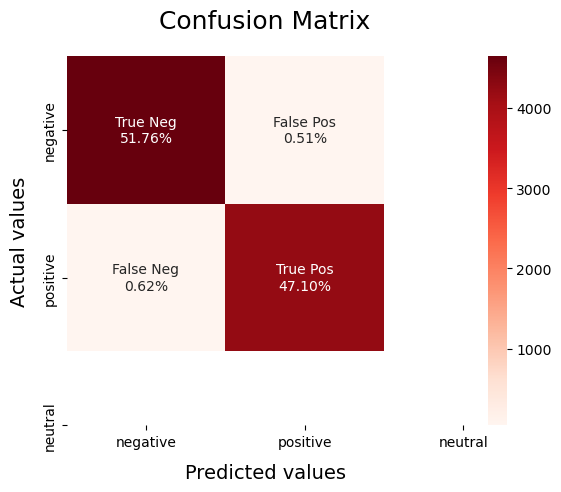

In [ ]:
from sklearn.linear_model import LogisticRegression
LRmodel = LogisticRegression(C = 2, max_iter = 1000, n_jobs=-1)
LRmodel.fit(x_train_vec, y_train)
LRmodel_pred=LRmodel.predict(x_test_vec)
model_Evaluate(y_test, LRmodel_pred)

In [ ]:
pd.DataFrame({'actual':y_test,
                      'predicted':LRmodel_pred})

,actual,predicted
41674,1,1
15812,0,0
3766,1,1
36003,1,1
4957,1,1
...,...,...
2170,0,0
9126,0,0
738,1,1
28427,0,0


accuracy:  0.993652561247216
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      4694
           1       1.00      0.99      0.99      4286

    accuracy                           0.99      8980
   macro avg       0.99      0.99      0.99      8980
weighted avg       0.99      0.99      0.99      8980



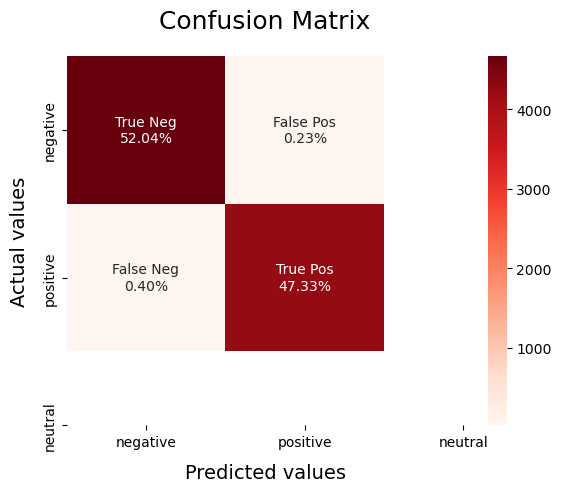

In [ ]:
from sklearn.svm import LinearSVC
SVCmodel = LinearSVC()
SVCmodel.fit(x_train_vec, y_train)
SVCmodel_pred=SVCmodel.predict(x_test_vec)
model_Evaluate(y_test, SVCmodel_pred)

In [ ]:
pd.DataFrame({'actual':y_test,
                      'predicted':SVCmodel_pred})

,actual,predicted
41674,1,1
15812,0,0
3766,1,1
36003,1,1
4957,1,1
...,...,...
2170,0,0
9126,0,0
738,1,1
28427,0,0


accuracy:  0.9633630289532294
              precision    recall  f1-score   support

           0       0.97      0.96      0.96      4694
           1       0.96      0.97      0.96      4286

    accuracy                           0.96      8980
   macro avg       0.96      0.96      0.96      8980
weighted avg       0.96      0.96      0.96      8980



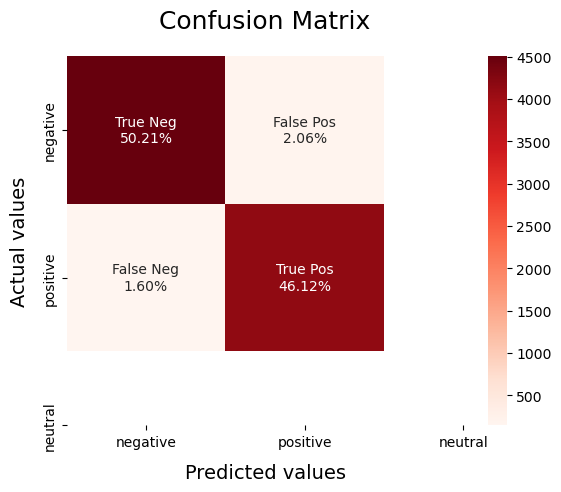

In [ ]:
from sklearn.naive_bayes import BernoulliNB
BNBmodel = BernoulliNB(alpha = 2)
BNBmodel.fit(x_train_vec, y_train)
BNBmodel_pred=BNBmodel.predict(x_test_vec)
model_Evaluate(y_test, BNBmodel_pred)

In [ ]:
pd.DataFrame({'actual':y_test,
                      'predicted':BNBmodel_pred})

,actual,predicted
41674,1,1
15812,0,0
3766,1,1
36003,1,1
4957,1,1
...,...,...
2170,0,0
9126,0,0
738,1,1
28427,0,0


## BOW vectorizer

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
vect = CountVectorizer(ngram_range=(1,2)).fit(x_train)
x_train_bow = vect.transform(x_train)
x_test_bow = vect.transform(x_test)

accuracy:  0.994988864142539
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      4694
           1       1.00      0.99      0.99      4286

    accuracy                           0.99      8980
   macro avg       1.00      0.99      0.99      8980
weighted avg       0.99      0.99      0.99      8980



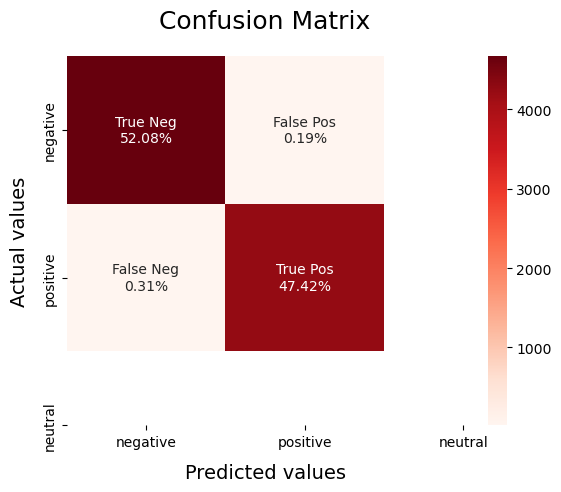

In [ ]:
from sklearn.linear_model import LogisticRegression
LRmodel = LogisticRegression(C = 2, max_iter = 1000, n_jobs=-1)
LRmodel.fit(x_train_bow, y_train)
LRmodel_pred_bow=LRmodel.predict(x_test_bow)
model_Evaluate(y_test, LRmodel_pred_bow)

In [ ]:
pd.DataFrame({'actual':y_test,
                      'predicted':LRmodel_pred_bow})

,actual,predicted
41674,1,1
15812,0,0
3766,1,1
36003,1,1
4957,1,1
...,...,...
2170,0,0
9126,0,0
738,1,1
28427,0,0


accuracy:  0.9938752783964365
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4694
           1       0.99      0.99      0.99      4286

    accuracy                           0.99      8980
   macro avg       0.99      0.99      0.99      8980
weighted avg       0.99      0.99      0.99      8980



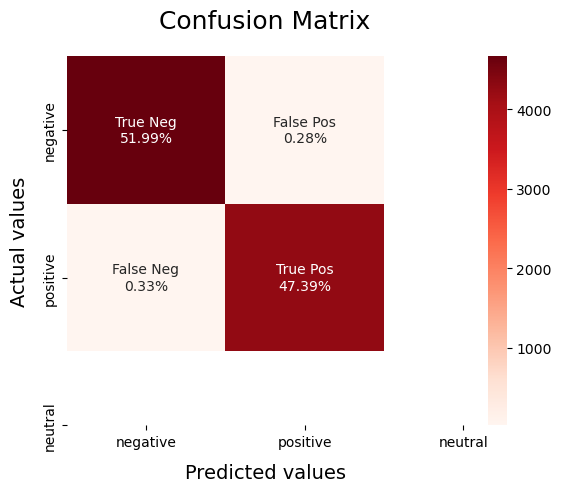

In [ ]:
from sklearn.svm import LinearSVC
SVCmodel = LinearSVC()
SVCmodel.fit(x_train_bow, y_train)
SVCmodel_pred=SVCmodel.predict(x_test_bow)
model_Evaluate(y_test, SVCmodel_pred)

accuracy:  0.9809576837416482
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      4694
           1       0.99      0.97      0.98      4286

    accuracy                           0.98      8980
   macro avg       0.98      0.98      0.98      8980
weighted avg       0.98      0.98      0.98      8980



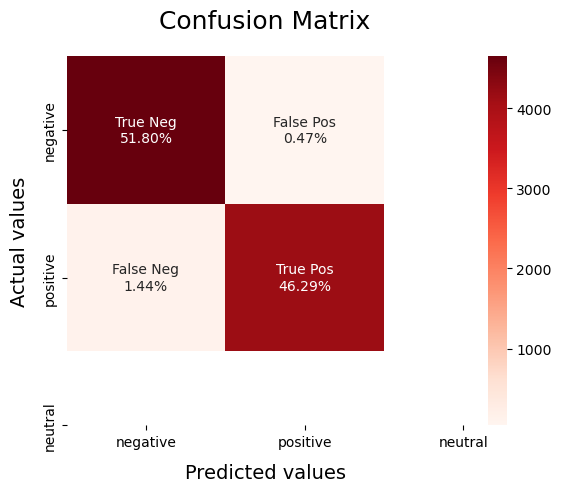

In [ ]:
from sklearn.naive_bayes import BernoulliNB
BNBmodel = BernoulliNB(alpha = 2)
BNBmodel.fit(x_train_bow, y_train)
BNBmodel_pred_bow=BNBmodel.predict(x_test_bow)
model_Evaluate(y_test, BNBmodel_pred_bow)

## Word embeddings

In [ ]:
# Import required libraries
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
# Tokenize the text
tokenizer = Tokenizer(num_words=10000, oov_token='<OOV>')
tokenizer.fit_on_texts(x_train)
x_train_seq = tokenizer.texts_to_sequences(x_train)
x_test_seq = tokenizer.texts_to_sequences(x_test)

In [ ]:
# Pad the sequences to the same length
max_len = 100
x_train_pad = pad_sequences(x_train_seq, maxlen=max_len, padding='post', truncating='post')
x_test_pad = pad_sequences(x_test_seq, maxlen=max_len, padding='post', truncating='post')

In [ ]:
# Build the model
model = Sequential()
model.add(Embedding(input_dim=10000, output_dim=32, input_length=max_len))
model.add(LSTM(64, dropout=0.2, recurrent_dropout=0.2))
model.add(Dense(32, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
# Fit the model with early stopping
early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
model.fit(x_train_pad, y_train, validation_split=0.2, epochs=20, batch_size=32, callbacks=[early_stop])

Epoch 1/20
898/898 [==============================] - 106s 115ms/step - loss: 0.2047 - accuracy: 0.9165 - val_loss: 0.0632 - val_accuracy: 0.9830
Epoch 2/20
898/898 [==============================] - 99s 110ms/step - loss: 0.0678 - accuracy: 0.9870 - val_loss: 0.0649 - val_accuracy: 0.9880
Epoch 3/20
898/898 [==============================] - 98s 109ms/step - loss: 0.0788 - accuracy: 0.9865 - val_loss: 0.0919 - val_accuracy: 0.9822
Epoch 4/20
898/898 [==============================] - 107s 119ms/step - loss: 0.1021 - accuracy: 0.9802 - val_loss: 0.1128 - val_accuracy: 0.9723


accuracy:  0.9835189309576837
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      4694
           1       0.98      0.98      0.98      4286

    accuracy                           0.98      8980
   macro avg       0.98      0.98      0.98      8980
weighted avg       0.98      0.98      0.98      8980



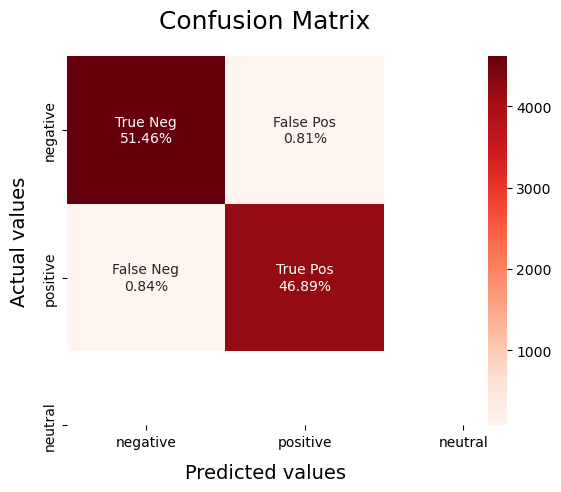

In [ ]:
# Test the model and print the confusion matrix
y_pred = np.round(model.predict(x_test_pad)).astype(int)
model_Evaluate(y_test, y_pred)

## The best model is using the Logistic Regression with BOW vectorizer, the accuracy was 0.994988864142539